# Title

# Problem Statement

DeepFake is composed from Deep Learning and Fake and means taking one person from an image or video and replacing with someone else likeness using technology such as Deep Artificial Neural Networks. Large companies like Google invest very much in fighting the DeepFake, this including release of large datasets to help training models to counter this threat.The phenomen invades rapidly the film industry and threatens to compromise news agencies. Large digital companies, including content providers and social platforms are in the frontrun of fighting Deep Fakes. GANs that generate DeepFakes becomes better every day and, of course, if you include in a new GAN model all the information we collected until now how to combat various existent models, we create a model that cannot be beatten by the existing ones.

First we will work on detecting faces that were forged and we will work on developing a model to detect videos.

# DeepFake Image detection

## About the Dataset

This dataset contains faces extracted from deepfake-detection-challenge. All images were of size 224x224. 

Due to memory issue we will only use a sample of the entire dataset for prediction.

## Importing Required libraries

In [2]:
import sys
import sklearn
import tensorflow as tf

import cv2
import pandas as pd
import numpy as np

import plotly.graph_objs as go
from plotly.offline import iplot
from matplotlib import pyplot as plt


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\ipykernel\kernelapp.py", line 739, in start
    self.io_lo

ImportError: 
A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.




A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\ipykernel\kernelapp.py", line 739, in start
    self.io_lo

ImportError: 
A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.




A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "C:\Users\parth\AppData\Roaming\Python\Python312\site-packages\ipykernel\kernelapp.py", line 739, in start
    self.io_lo

ImportError: 
A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.



SystemError: initialization of _pywrap_checkpoint_reader raised unreported exception

In [ ]:
tf.test.is_gpu_available()

True

In [ ]:
tf.__version__

'2.1.0-rc0'

In [ ]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Data Visualisation

In [ ]:
import os

def get_data():
    return pd.read_csv('../input/deepfake-faces/metadata.csv')

In [ ]:
meta=get_data()
meta.head()

,videoname,original_width,original_height,label,original
0,aznyksihgl.mp4,129,129,FAKE,xnojggkrxt.mp4
1,gkwmalrvcj.mp4,129,129,FAKE,hqqmtxvbjj.mp4
2,lxnqzocgaq.mp4,223,217,FAKE,xjzkfqddyk.mp4
3,itsbtrrelv.mp4,186,186,FAKE,kqvepwqxfe.mp4
4,ddvgrczjno.mp4,155,155,FAKE,pluadmqqta.mp4


In [ ]:
meta.shape

(95634, 5)

In [ ]:
len(meta[meta.label=='FAKE']),len(meta[meta.label=='REAL'])

(79341, 16293)

In [ ]:
real_df = meta[meta["label"] == "REAL"]
fake_df = meta[meta["label"] == "FAKE"]
sample_size = 8000

real_df = real_df.sample(sample_size, random_state=42)
fake_df = fake_df.sample(sample_size, random_state=42)

sample_meta = pd.concat([real_df, fake_df])

As mentioned instead of using 95k images we will only use 16000 images.

In [ ]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(sample_meta,test_size=0.2,random_state=42,stratify=sample_meta['label'])
Train_set, Val_set  = train_test_split(Train_set,test_size=0.3,random_state=42,stratify=Train_set['label'])

In [ ]:
Train_set.shape,Val_set.shape,Test_set.shape

((8960, 5), (3840, 5), (3200, 5))

In [ ]:
y = dict()

y[0] = []
y[1] = []

for set_name in (np.array(Train_set['label']), np.array(Val_set['label']), np.array(Test_set['label'])):
    y[0].append(np.sum(set_name == 'REAL'))
    y[1].append(np.sum(set_name == 'FAKE'))

trace0 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[0],
    name='REAL',
    marker=dict(color='#33cc33'),
    opacity=0.7
)
trace1 = go.Bar(
    x=['Train Set', 'Validation Set', 'Test Set'],
    y=y[1],
    name='FAKE',
    marker=dict(color='#ff3300'),
    opacity=0.7
)

data = [trace0, trace1]
layout = go.Layout(
    title='Count of classes in each set',
    xaxis={'title': 'Set'},
    yaxis={'title': 'Count'}
)

fig = go.Figure(data, layout)
iplot(fig)

The original image dataset were biased with more fake images than real since we are taking a sample of it its better to take equal proportion of real and fake images.

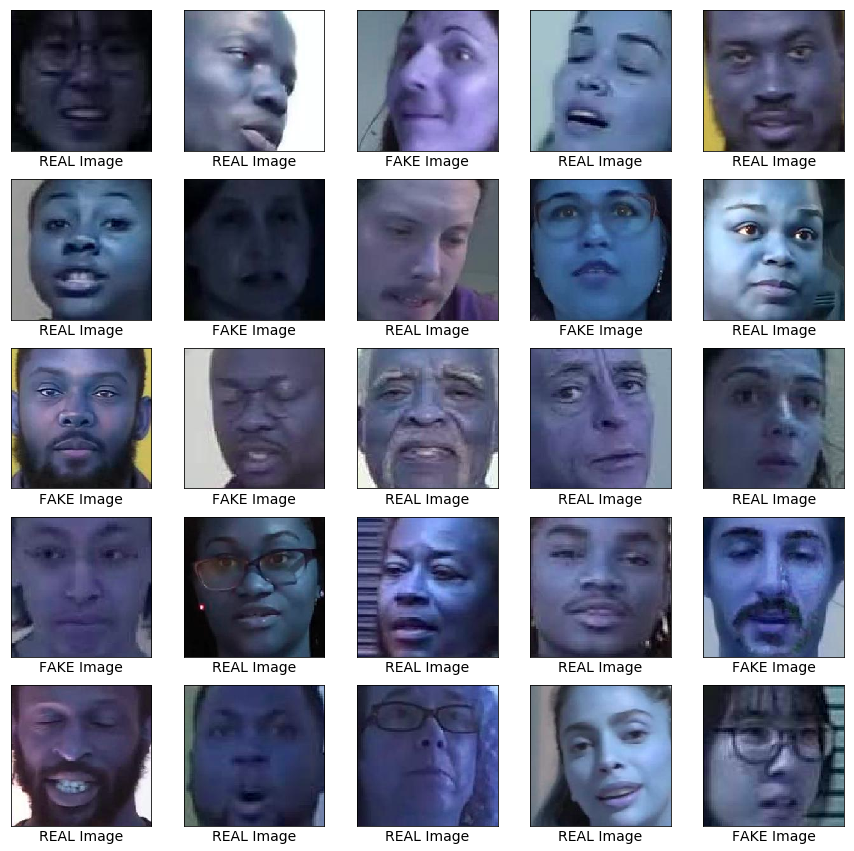

In [ ]:
plt.figure(figsize=(15,15))
for cur,i in enumerate(Train_set.index[25:50]):
    plt.subplot(5,5,cur+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    
    plt.imshow(cv2.imread('../input/deepfake-faces/faces_224/'+Train_set.loc[i,'videoname'][:-4]+'.jpg'))
    
    if(Train_set.loc[i,'label']=='FAKE'):
        plt.xlabel('FAKE Image')
    else:
        plt.xlabel('REAL Image')
        
plt.show()

## Modelling

Before jumping to use pretrained model lets develop some base line model to test how our pretrained model outperforms.

### Custom CNN Architecture

In [ ]:
def retreive_dataset(set_name):
    images,labels=[],[]
    for (img, imclass) in zip(set_name['videoname'], set_name['label']):
        images.append(cv2.imread('../input/deepfake-faces/faces_224/'+img[:-4]+'.jpg'))
        if(imclass=='FAKE'):
            labels.append(1)
        else:
            labels.append(0)
    
    return np.array(images),np.array(labels)

In [ ]:
X_train,y_train=retreive_dataset(Train_set)
X_val,y_val=retreive_dataset(Val_set)
X_test,y_test=retreive_dataset(Test_set)

In [ ]:
from functools import partial

tf.random.set_seed(42) 
DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, padding="same",
                        activation="relu", kernel_initializer="he_normal")

model = tf.keras.Sequential([
    DefaultConv2D(filters=64, kernel_size=7, input_shape=[224, 224, 3]),
    tf.keras.layers.MaxPool2D(),
    DefaultConv2D(filters=128),
    DefaultConv2D(filters=128),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=64, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=1, activation="sigmoid")
])

In [ ]:
model.compile(loss="binary_crossentropy", optimizer="nadam",
              metrics=["accuracy"])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 64)      9472      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 128)     73856     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 128)     147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 56, 56, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 401408)            0         
_________________________________________________________________
dense (Dense)                (None, 128)               5

In [ ]:
history = model.fit(X_train, y_train, epochs=5,batch_size=64,
                    validation_data=(X_val, y_val))

Train on 8960 samples, validate on 3840 samples
Epoch 1/5
8960/8960 [==============================] - 32s 4ms/sample - loss: 90.6467 - accuracy: 0.4988 - val_loss: 0.6930 - val_accuracy: 0.5159
Epoch 2/5
8960/8960 [==============================] - 27s 3ms/sample - loss: 0.6931 - accuracy: 0.5097 - val_loss: 0.6924 - val_accuracy: 0.5201
Epoch 3/5
8960/8960 [==============================] - 27s 3ms/sample - loss: 0.6934 - accuracy: 0.5176 - val_loss: 0.6938 - val_accuracy: 0.5083
Epoch 4/5
8960/8960 [==============================] - 27s 3ms/sample - loss: 0.6902 - accuracy: 0.5269 - val_loss: 0.6939 - val_accuracy: 0.5128
Epoch 5/5
8960/8960 [==============================] - 27s 3ms/sample - loss: 6.4223 - accuracy: 0.5256 - val_loss: 0.6924 - val_accuracy: 0.5208


In [ ]:
score = model.evaluate(X_test, y_test)

3200/3200 [==============================] - 3s 998us/sample - loss: 0.6934 - accuracy: 0.4928


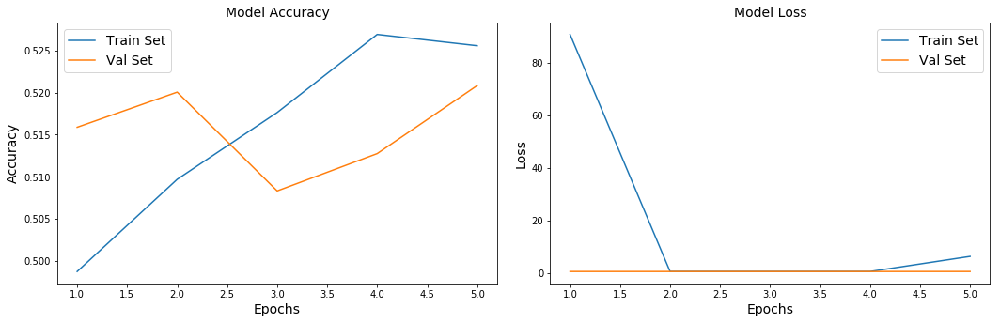

In [ ]:
# plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

A baseline score of 50.06% is good to go let's finetune some pretrained model

# Pretrained Models for Transfer Learning

Here i used Xception model for fine-tuning feel free to try the performance of other pretrained models.

All three datasets contain individual images. We need to batch them, but for this we first need to ensure they all have the same size, or else batching will not work. We can use a `Resizing` layer for this. We must also call the `tf.keras.applications.xception.preprocess_input()` function to preprocess the images appropriately for the Xception model. We will also add shuffling and prefetching to the training dataset.

In [ ]:
train_set_raw=tf.data.Dataset.from_tensor_slices((X_train,y_train))
valid_set_raw=tf.data.Dataset.from_tensor_slices((X_val,y_val))
test_set_raw=tf.data.Dataset.from_tensor_slices((X_test,y_test))

In [ ]:
tf.keras.backend.clear_session()  # extra code – resets layer name counter

batch_size = 32
preprocess = tf.keras.applications.xception.preprocess_input
train_set = train_set_raw.map(lambda X, y: (preprocess(tf.cast(X, tf.float32)), y))
train_set = train_set.shuffle(1000, seed=42).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(lambda X, y: (preprocess(tf.cast(X, tf.float32)), y)).batch(batch_size)
test_set = test_set_raw.map(lambda X, y: (preprocess(tf.cast(X, tf.float32)), y)).batch(batch_size)

Let's take a look again at the first 9 images from the validation set: they're all with values ranging from -1 to 1:

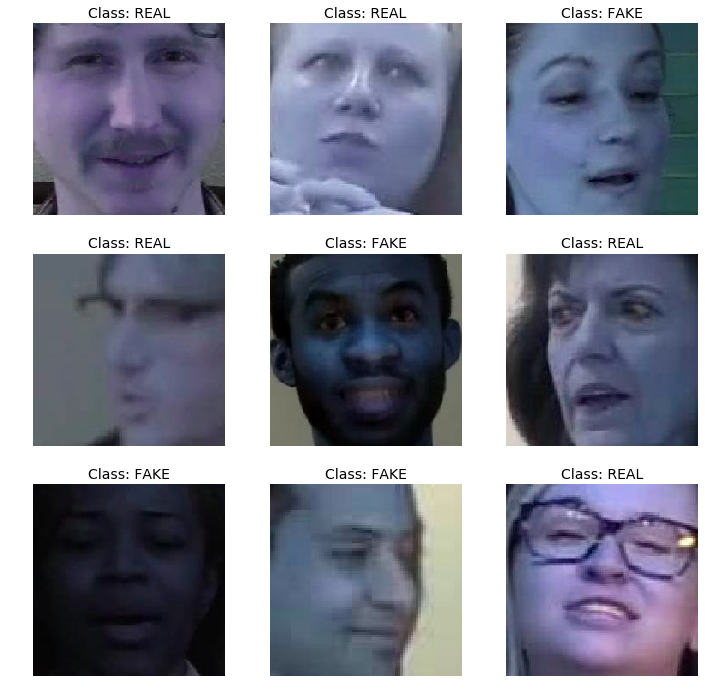

In [ ]:
# extra code – displays the first 9 images in the first batch of valid_set

plt.figure(figsize=(12, 12))
for X_batch, y_batch in valid_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow((X_batch[index] + 1) / 2)  # rescale to 0–1 for imshow()
        if(y_batch[index]==1):
            classt='FAKE'
        else:
            classt='REAL'
        plt.title(f"Class: {classt}")
        plt.axis("off")

plt.show()

In [ ]:
pip install --upgrade tensorflow

     |████████████████████████████████| 458.3MB 28kB/s s eta 0:00:01    |█████▋                          | 81.0MB 49.9MB/s eta 0:00:08
     |████████████████████████████████| 4.6MB 26kB/s s eta 0:00:01
     |████████████████████████████████| 133kB 38.2MB/s eta 0:00:01
     |████████████████████████████████| 5.6MB 37.4MB/s eta 0:00:01
     |████████████████████████████████| 4.0MB 24.1MB/s eta 0:00:01
     |████████████████████████████████| 14.8MB 29.9MB/s eta 0:00:01
     |████████████████████████████████| 61kB 6.3MB/s  eta 0:00:01
     |████████████████████████████████| 1.3MB 44.5MB/s eta 0:00:01
     |████████████████████████████████| 471kB 44.9MB/s eta 0:00:01
     |████████████████████████████████| 71kB 6.7MB/s  eta 0:00:01
     |████████████████████████████████| 51kB 4.5MB/s  eta 0:00:01
     |████████████████████████████████| 4.9MB 58.4MB/s eta 0:00:01
     |████████████████████████████████| 788kB 27.0MB/s eta 0:00:01
  Created wheel for wrapt: filename=wrapt-1.12.1-cp36-cp36m-lin

In [ ]:
print(tf.__version__) 


2.1.0-rc0


In [ ]:
!pip install tensorflow==2.5.0

     |████████████████████████████████| 454.3MB 28kB/s s eta 0:00:01     |████████████████████████▏       | 343.4MB 55.9MB/s eta 0:00:02
     |████████████████████████████████| 4.0MB 24.6MB/s eta 0:00:01
     |████████████████████████████████| 471kB 38.2MB/s eta 0:00:01
     |████████████████████████████████| 1.2MB 30kB/s s eta 0:00:01
  Found existing installation: grpcio 1.48.2
    Uninstalling grpcio-1.48.2:
      Successfully uninstalled grpcio-1.48.2
  Found existing installation: tensorflow-estimator 2.6.0
    Uninstalling tensorflow-estimator-2.6.0:
      Successfully uninstalled tensorflow-estimator-2.6.0
  Found existing installation: tensorflow 2.6.2
    Uninstalling tensorflow-2.6.2:
      Successfully uninstalled tensorflow-2.6.2


In [ ]:
import tensorflow as tf
from keras_preprocessing.image import ImageDataGenerator

data_augmentation = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

def augment_image(image):
    image = image.reshape((1,) + image.shape)
    aug_iter = data_augmentation.flow(image, batch_size=1)
    aug_image = next(aug_iter)[0]
    return aug_image

# Example usage:
# augmented = augment_image(your_image)

Try running the following cell multiple times to see different random data augmentations:

Now let's load the pretrained model, without its top layers, and replace them with our own task

In [ ]:
tf.random.set_seed(42)  # extra code – ensures reproducibility
base_model = tf.keras.applications.xception.Xception(weights="imagenet",
                                                     include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(1, activation="sigmoid")(avg)
model = tf.keras.Model(inputs=base_model.input, outputs=output)

83689472/83683744 [==============================] - 0s 0us/step


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

Let's train the model for a few epochs, while keeping the base model weights fixed:

In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9)
model.compile(loss="binary_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set, validation_data=valid_set, epochs=3)

Train for 280 steps, validate for 120 steps
Epoch 1/3
280/280 [==============================] - 39s 138ms/step - loss: 0.8017 - accuracy: 0.5825 - val_loss: 1.1171 - val_accuracy: 0.5128
Epoch 2/3
280/280 [==============================] - 35s 127ms/step - loss: 0.7083 - accuracy: 0.6313 - val_loss: 0.8067 - val_accuracy: 0.5755
Epoch 3/3
280/280 [==============================] - 35s 126ms/step - loss: 0.7140 - accuracy: 0.6479 - val_loss: 1.0637 - val_accuracy: 0.5391


In [ ]:
for indices in zip(range(33), range(33, 66), range(66, 99), range(99, 132)):
    for idx in indices:
        print(f"{idx:3}: {base_model.layers[idx].name:22}", end="")
    print()

  0: input_1                33: block4_pool            66: block8_sepconv1_act    99: block11_sepconv2_act  
  1: block1_conv1           34: batch_normalization_2  67: block8_sepconv1       100: block11_sepconv2      
  2: block1_conv1_bn        35: add_2                  68: block8_sepconv1_bn    101: block11_sepconv2_bn   
  3: block1_conv1_act       36: block5_sepconv1_act    69: block8_sepconv2_act   102: block11_sepconv3_act  
  4: block1_conv2           37: block5_sepconv1        70: block8_sepconv2       103: block11_sepconv3      
  5: block1_conv2_bn        38: block5_sepconv1_bn     71: block8_sepconv2_bn    104: block11_sepconv3_bn   
  6: block1_conv2_act       39: block5_sepconv2_act    72: block8_sepconv3_act   105: add_9                 
  7: block2_sepconv1        40: block5_sepconv2        73: block8_sepconv3       106: block12_sepconv1_act  
  8: block2_sepconv1_bn     41: block5_sepconv2_bn     74: block8_sepconv3_bn    107: block12_sepconv1      
  9: block2_sepconv

In [ ]:
model.evaluate(test_set)

100/100 [==============================] - 8s 76ms/step - loss: 1.0629 - accuracy: 0.5375


[1.0628775423765182, 0.5375]

Now with the finetuning the top layers of xception model the model performance jumps to 63.8% 

Now that the weights of our new top layers are not too bad, we can make the top part of the base model trainable again, and continue training, but with a lower learning rate:

In [ ]:
for layer in base_model.layers[56:]:
    layer.trainable = True

optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
model.compile(loss="binary_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set, validation_data=valid_set, epochs=10)

Train for 280 steps, validate for 120 steps
Epoch 1/10
280/280 [==============================] - 58s 208ms/step - loss: 0.5714 - accuracy: 0.7022 - val_loss: 0.9274 - val_accuracy: 0.5594
Epoch 2/10
280/280 [==============================] - 54s 193ms/step - loss: 0.2679 - accuracy: 0.8852 - val_loss: 0.9274 - val_accuracy: 0.6279
Epoch 3/10
280/280 [==============================] - 54s 192ms/step - loss: 0.1454 - accuracy: 0.9443 - val_loss: 2.3957 - val_accuracy: 0.5411
Epoch 4/10
280/280 [==============================] - 54s 192ms/step - loss: 0.1020 - accuracy: 0.9624 - val_loss: 1.8277 - val_accuracy: 0.5935
Epoch 5/10
280/280 [==============================] - 54s 192ms/step - loss: 0.0638 - accuracy: 0.9771 - val_loss: 3.4709 - val_accuracy: 0.5255
Epoch 6/10
280/280 [==============================] - 54s 192ms/step - loss: 0.0413 - accuracy: 0.9853 - val_loss: 3.1199 - val_accuracy: 0.5521
Epoch 7/10
280/280 [==============================] - 54s 193ms/step - loss: 0.0397 - 

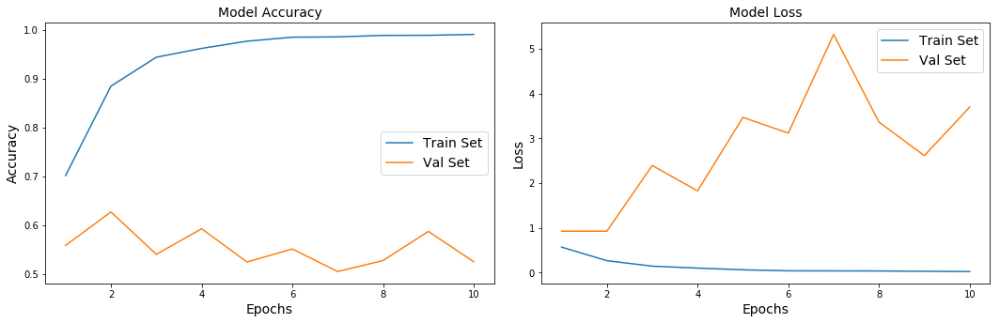

In [ ]:
# plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

In [ ]:
model.evaluate(test_set)

100/100 [==============================] - 8s 76ms/step - loss: 3.6081 - accuracy: 0.5306


[3.6081369280815125, 0.530625]

The model accuracy finally reaches to 81.9%

In [ ]:
model.save('xception_deepfake_image.keras')

# Add Explainability to the model

Lets try to interpret the trained model on how it finds a image FAKE

In [ ]:
!pip install lime

In [ ]:
from lime import lime_image

explainer = lime_image.LimeImageExplainer()

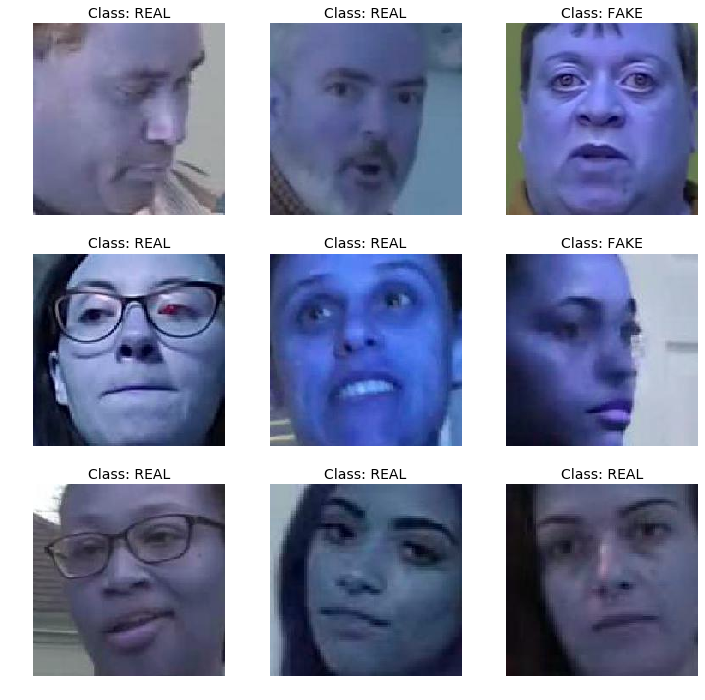

In [ ]:

plt.figure(figsize=(12, 12))

for index in range(9):
    plt.subplot(3, 3, index + 1)
    plt.imshow((X_test[index] / 255.0))  # Normalize to 0–1 for imshow()
    if y_test[index] == 1:
        classt = 'FAKE'
    else:
        classt = 'REAL'
    plt.title(f"Class: {classt}")
    plt.axis("off")

plt.show()



In [ ]:
test_data = X_test[2]
print(test_data.shape)

(224, 224, 3)


In [ ]:
explanation = explainer.explain_instance(test_data.astype('double'), model.predict,  
                                         top_labels=3, hide_color=0, num_samples=1000)

(-0.5, 223.5, 223.5, -0.5)

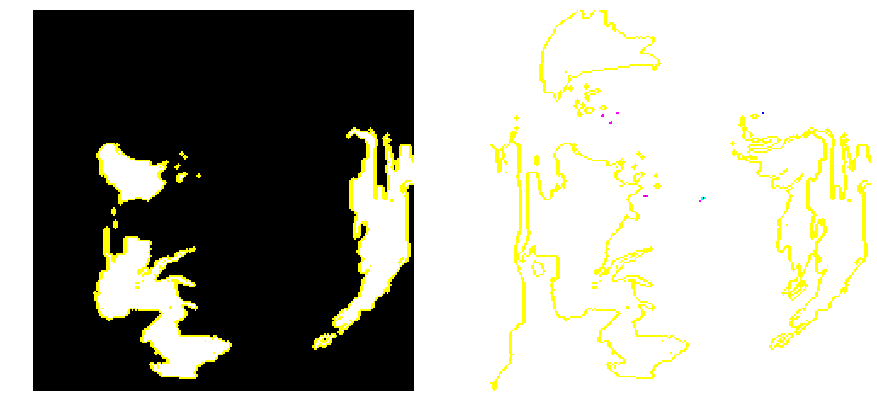

In [ ]:
from skimage.segmentation import mark_boundaries

temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

# Deep Fake Video Classification

## About the dataset

Files

* train_sample_videos.zip - a ZIP file containing a sample set of training videos and a metadata.json with labels. the full set of training videos is available through the links provided above.
* sample_submission.csv - a sample submission file in the correct format.
* test_videos.zip - a zip file containing a small set of videos to be used as a public validation set. To understand the datasets available for this competition, review the Getting Started information.

Metadata Columns

* filename - the filename of the video
* label - whether the video is REAL or FAKE
* original - in the case that a train set video is FAKE, the original video is listed here
* split - this is always equal to "train".

## Importing required libraries

In [ ]:
# from tensorflow_docs.vis import embed
from tensorflow import keras

## Data Visualisation

In [ ]:
DATA_FOLDER = '../input/deepfake-detection-challenge'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
TEST_FOLDER = 'test_videos'

print(f"Train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"Test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

Train samples: 401
Test samples: 400


In [ ]:

train_sample_metadata = pd.read_json('../input/deepfake-detection-challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


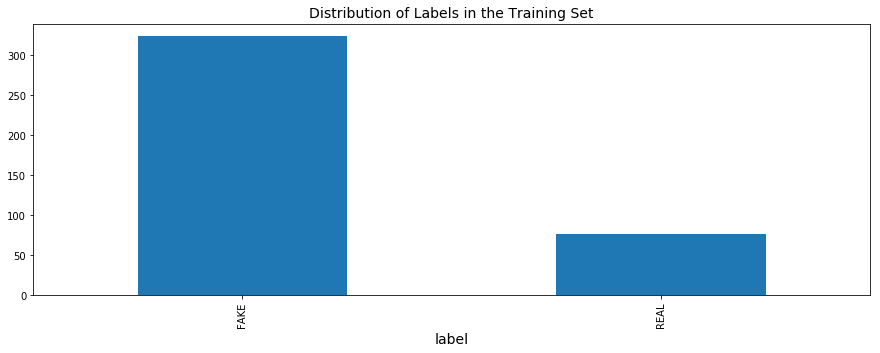

In [ ]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

In [ ]:
train_sample_metadata.shape

(400, 3)

Let's visualize now the data.

We select first a list of fake videos.

### Few fake videos

In [ ]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(3).index)
fake_train_sample_video

['ebchwmwayp.mp4', 'acxnxvbsxk.mp4', 'bahdpoesir.mp4']

In [ ]:
def display_image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_image = cv2.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

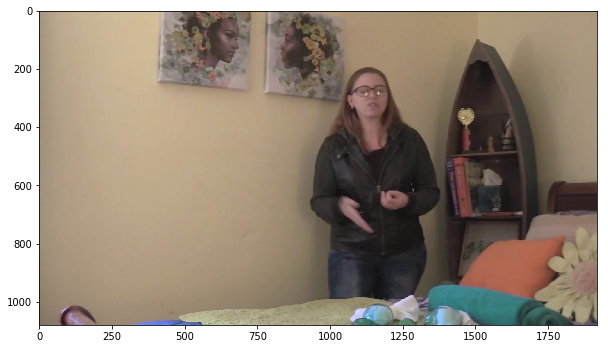

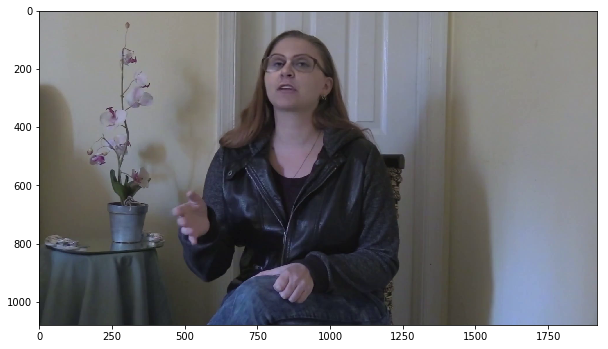

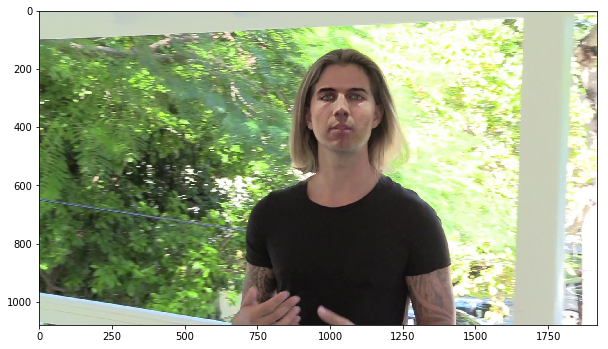

In [ ]:
for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

Let's try now the same for few of the images that are real.

### Few Real Videos

In [ ]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(3).index)
real_train_sample_video

['dlpoieqvfb.mp4', 'bgwmmujlmc.mp4', 'dakiztgtnw.mp4']

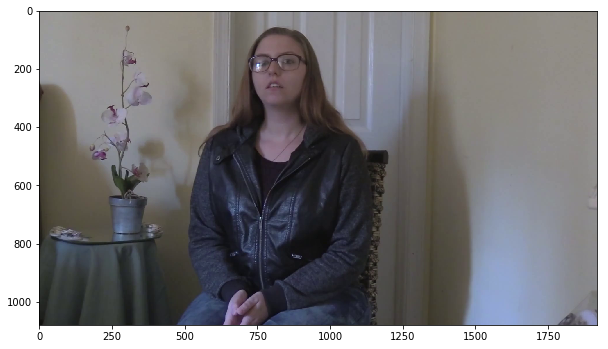

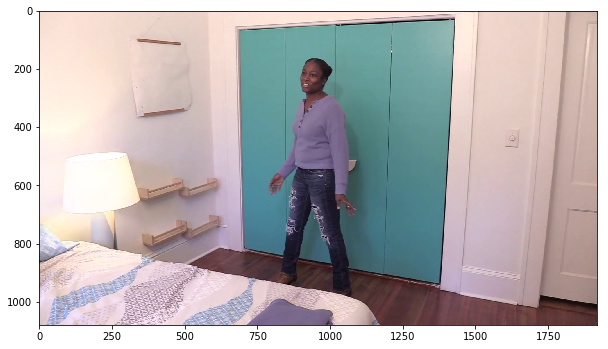

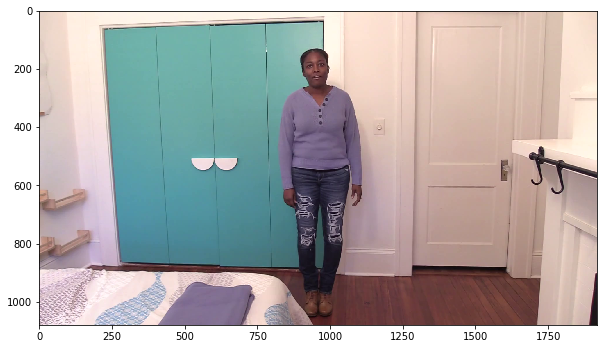

In [ ]:
for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

### Videos with same original

Let's look now to set of samples with the same original.

In [ ]:
train_sample_metadata['original'].value_counts()[0:5]

atvmxvwyns.mp4    6
meawmsgiti.mp4    6
kgbkktcjxf.mp4    5
qeumxirsme.mp4    5
fysyrqfguw.mp4    4
Name: original, dtype: int64

We pick one of the originals with largest number of samples.

We also modify our visualization function to work with multiple images.

In [ ]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    '''
    input: video_path_list - path for video
    process:
    0. for each video in the video path list
        1. perform a video capture from the video
        2. read the image
        3. display the image
    '''
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    # we only show images extracted from the first 6 videos
    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(DATA_FOLDER, video_folder,video_file)
        capture_image = cv2.VideoCapture(video_path) 
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')


<Figure size 432x288 with 0 Axes>

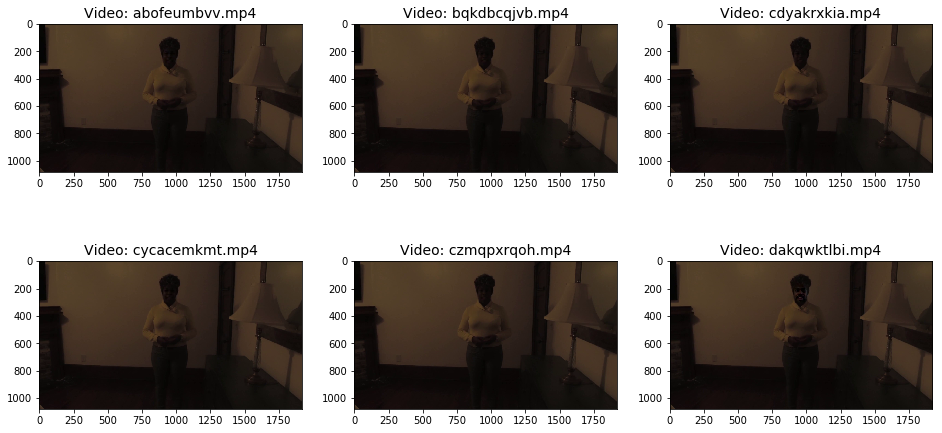

In [ ]:
same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='atvmxvwyns.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

### Test video files

Let's also look to few of the test data files.

In [ ]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [ ]:
test_videos.head()

,video
0,qooxnxqqjb.mp4
1,hierggamuo.mp4
2,ocgdbrgmtq.mp4
3,icbsahlivv.mp4
4,prhmixykhr.mp4


Let's visualize now one of the videos.

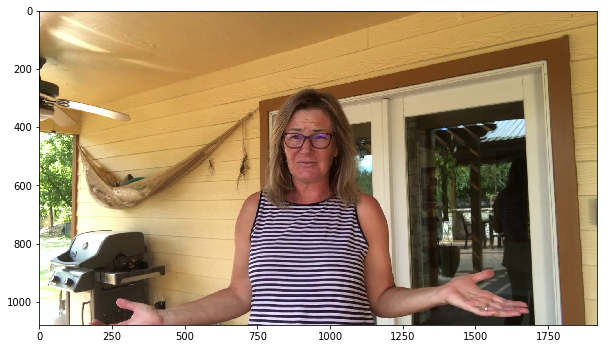

In [ ]:
display_image_from_video(os.path.join(DATA_FOLDER, TEST_FOLDER, test_videos.iloc[2].video))

### Play video files

Let's look to few fake videos.

In [ ]:
fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join(DATA_FOLDER, subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

play_video(fake_videos[10])

From visual inspection of these fakes videos, in some cases is very easy to spot the anomalies created when engineering the deep fake, in some cases is more difficult.

## Modelling

### A CNN-RNN Architecture

 In this example we will do the following:

* Capture the frames of a video.
* Extract frames from the videos until a maximum frame count is reached.
* In the case, where a video's frame count is lesser than the maximum frame count we will pad the video with zeros.

Since we don't have test labels we split the training data to find its performance in unseen data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import cv2
import os
import imageio

# Set constants
IMG_SIZE = 224
MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048
BATCH_SIZE = 8
EPOCHS = 10

In [ ]:
# Function to crop and load video frames
def crop_center_square(frame):
    y, x = frame.shape[:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y:start_y + min_dim, start_x:start_x + min_dim]

def load_video(video_path, max_frames=MAX_SEQ_LENGTH, resize=(IMG_SIZE, IMG_SIZE)):
    """Load a video and return its frames as a NumPy array."""
    cap = cv2.VideoCapture(video_path)
    frames = []
    while len(frames) < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frame = crop_center_square(frame)
        frame = cv2.resize(frame, resize)
        frame = frame[:, :, [2, 1, 0]]  # Convert BGR to RGB
        frames.append(frame)
    cap.release()
    return np.array(frames)


In [ ]:
# Build feature extractor
def build_feature_extractor():
    """Create a feature extractor using the InceptionV3 model."""
    base_model = keras.applications.InceptionV3(weights="imagenet", include_top=False, pooling="avg")
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    x = preprocess_input(inputs)
    outputs = base_model(x)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = build_feature_extractor()


In [ ]:
def prepare_videos(video_paths):
    """Prepare feature arrays for a list of videos."""
    num_samples = len(video_paths)
    frame_features = np.zeros((num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, video_path in enumerate(video_paths):
        frames = load_video(video_path)
        num_frames = min(MAX_SEQ_LENGTH, len(frames))
        for j in range(num_frames):
            frame_features[i, j] = feature_extractor.predict(frames[None, j])
    return frame_features


In [ ]:
def build_simple_model():
    """Create a simple sequential model using Dense layers."""
    model = keras.Sequential([
        keras.layers.Flatten(input_shape=(MAX_SEQ_LENGTH, NUM_FEATURES)),
        keras.layers.Dense(128, activation="relu"),
        keras.layers.Dropout(0.4),
        keras.layers.Dense(64, activation="relu"),
        keras.layers.Dropout(0.4),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    
    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
    return model

model = build_simple_model()
model.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 40960)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               5243008   
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 65        
Total params: 5,251,329
Trainable params: 5,251,329
Non-trainable params: 0
____________________________________________

In [ ]:
# Example video paths and labels
train_video_paths = ["path/to/video1.mp4", "path/to/video2.mp4"]
train_labels = np.array([1, 0])  # Example labels (1 for FAKE, 0 for REAL)

# Prepare the data
train_features = prepare_videos(train_video_paths)

# Train the model
model.fit(train_features, train_labels, epochs=EPOCHS, batch_size=BATCH_SIZE)


Train on 2 samples
Epoch 1/10
2/2 [==============================] - 0s 4ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 2/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 3/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 4/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 5/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 6/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 7/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 8/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 9/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000
Epoch 10/10
2/2 [==============================] - 0s 2ms/sample - loss: 0.6931 - accuracy: 0.5000


In [ ]:
# Train the Model with Checkpointing
checkpoint = keras.callbacks.ModelCheckpoint(
    'best_deepfake_model.keras', save_weights_only=True, save_best_only=True, monitor="val_loss"
)

history = model.fit(
    train_features, train_labels, 
    validation_split=0.05,  
    callbacks=[checkpoint],
    epochs=EPOCHS, 
    batch_size=BATCH_SIZE
)

Train on 1 samples, validate on 1 samples
Epoch 1/10
1/1 [==============================] - 0s 64ms/sample - loss: 0.6702 - accuracy: 1.0000 - val_loss: 0.7172 - val_accuracy: 0.0000e+00
Epoch 2/10
1/1 [==============================] - 0s 12ms/sample - loss: 0.6697 - accuracy: 1.0000 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 3/10
1/1 [==============================] - 0s 11ms/sample - loss: 0.6691 - accuracy: 1.0000 - val_loss: 0.7184 - val_accuracy: 0.0000e+00
Epoch 4/10
1/1 [==============================] - 0s 11ms/sample - loss: 0.6685 - accuracy: 1.0000 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 5/10
1/1 [==============================] - 0s 11ms/sample - loss: 0.6679 - accuracy: 1.0000 - val_loss: 0.7196 - val_accuracy: 0.0000e+00
Epoch 6/10
1/1 [==============================] - 0s 11ms/sample - loss: 0.6674 - accuracy: 1.0000 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 7/10
1/1 [==============================] - 0s 11ms/sample - loss: 0.6668 - accura

In [ ]:
import numpy as np
import os
import imageio

def prepare_single_video(frames):
    """Prepare a single video by extracting its features for prediction."""
    frames = frames[None, ...]
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])

    return frame_features

def sequence_prediction(path):
    """Predict whether the video is FAKE or REAL."""
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER, path))
    frame_features = prepare_single_video(frames)
    prediction = model.predict(frame_features)[0]
    return prediction

def to_gif(images):
    """Convert video frames to GIF for display."""
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

# Randomly select a test video from the list of test videos
test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

# Predict if the video is FAKE or REAL
prediction = sequence_prediction(test_video)
if prediction >= 0.5:
    print('The video is FAKE')
else:
    print('The video is REAL')

# Play the selected video (assuming `play_video` is defined)
play_video(test_video, TEST_FOLDER)


Test video path: zuwwbbusgl.mp4
The video is REAL
